In [ ]:
#!pip install -q tensorflow== 2.13.0
#!apt-get -q update && apt-get install -q -y python3-opencv #if you using TPU 

# Import Libraries

In [1]:
# Setup color
class color:
    BOLD = '\033[1m'
    BOLD_COLOR = '\033[1m' + '\033[34m'
    END = '\033[0m'

    
print(color.BOLD_COLOR + 'Importing libraries.....' + color.END)    

# Import Libraries basic
import itertools
import os

# Turn off warnings
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings('ignore',category = ConvergenceWarning)
warnings.simplefilter(action = 'ignore', category = FutureWarning)
warnings.simplefilter(action = 'ignore', category = UserWarning)

# Import Libraries Proprecessing Image
from PIL import Image
import cv2

# Import Librares Proprecessing Data
import numpy as np
import pandas as pd

# Import Libraries Visualizition
import matplotlib.pyplot as plt
import seaborn as sns

# Import Libraries sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, f1_score , confusion_matrix
from sklearn.preprocessing import LabelEncoder

# Tensorflow Libraries
import tensorflow as tf
import keras
from keras.layers import Dense,Dropout,BatchNormalization
from keras.optimizers import Adam
from keras import layers,models,Model
from tensorflow.keras import preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau, LearningRateScheduler
from keras.applications import ResNet50V2
from keras.utils import plot_model
from tensorflow.python.client import device_lib

# Check Version Tensorflow and Keras
print(color.BOLD + '\nTensorflow Version: {}'.format(tf.__version__))
print('\nKeras Version: {}'.format(keras.__version__) + color.END)

# Check GPU on Kaggle if print ['/device:GPU:0'] is using GPU else print () is using CPU or TPU
def get_avaibable_gpus():
    local_device_protos = device_lib.list_local_devices()
    return[x.name for x in local_device_protos if x.device_type == 'GPU']
print(f'\nDevice using: ',get_avaibable_gpus())

print(color.BOLD_COLOR + '\nDone!\n' + color.END)

Importing libraries.....


2024-06-21 16:40:55.608644: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-21 16:40:55.608755: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-21 16:40:55.741910: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered



Tensorflow Version: 2.15.0

Keras Version: 3.0.5

Device using:  ['/device:GPU:0']

Done!



# Import Dataset 

In [2]:
path = "/kaggle/input/animal-image-dataset-90-different-animals/animals/animals"

data = {"imgpath": [] , "labels": [] }

category = os.listdir(path)
for folder in category:
    folderpath = os.path.join(path , folder)
    filelist = os.listdir(folderpath)
    for file in filelist:
        fpath = os.path.join(folderpath, file)
        data["imgpath"].append(fpath) # Link images
        data["labels"].append(folder) # Name animal

df = pd.DataFrame(data) # Create DataFrame 

# Convert labels to numbers
lb = LabelEncoder()
df['encoded_labels'] = lb.fit_transform(df['labels'])
df

,imgpath,labels,encoded_labels
0,/kaggle/input/animal-image-dataset-90-differen...,beetle,5
1,/kaggle/input/animal-image-dataset-90-differen...,beetle,5
2,/kaggle/input/animal-image-dataset-90-differen...,beetle,5
3,/kaggle/input/animal-image-dataset-90-differen...,beetle,5
4,/kaggle/input/animal-image-dataset-90-differen...,beetle,5
...,...,...,...
5395,/kaggle/input/animal-image-dataset-90-differen...,boar,7
5396,/kaggle/input/animal-image-dataset-90-differen...,boar,7
5397,/kaggle/input/animal-image-dataset-90-differen...,boar,7
5398,/kaggle/input/animal-image-dataset-90-differen...,boar,7


# Split Dataset Train, Test, Vaild

In [4]:
# Split train, valid, test
train_df, temp_df = train_test_split(df, train_size= 0.70 , shuffle= True, random_state= 124)
valid_df , test_df = train_test_split(temp_df , train_size= 0.70 , shuffle= True, random_state= 124)

# Do you try to index into dataframe columns. This resets the index to the default integer index
train_df = train_df.reset_index(drop=True)
valid_df = valid_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

# Training datasets
print(color.BOLD_COLOR + "----------Train-------------" + color.END)
print(color.BOLD + train_df[["imgpath", "labels"]].head())
print(color.BOLD + 'Shape Train: {}\n\n'.format(train_df.shape))

# Validation datasets
print(color.BOLD_COLOR + "--------Validation----------" + color.END)
print(color.BOLD  + valid_df[["imgpath", "labels"]].head())
print(color.BOLD + 'Shape Validation: {}\n\n'.format(valid_df.shape))

# Testing datasets
print(color.BOLD_COLOR + "----------Test--------------" + color.END)
print(color.BOLD + test_df[["imgpath", "labels"]].head())
print(color.BOLD + 'Shape Test: {}'.format(test_df.shape))

----------Train-------------
                                             imgpath           labels
0  /kaggle/input/animal-image-dataset-90-diff...     elephant
1  /kaggle/input/animal-image-dataset-90-diff...      hamster
2  /kaggle/input/animal-image-dataset-90-diff...  caterpillar
3  /kaggle/input/animal-image-dataset-90-diff...     hedgehog
4  /kaggle/input/animal-image-dataset-90-diff...          rat
Shape Train: (3779, 3)


--------Validation----------
                                             imgpath           labels
0  /kaggle/input/animal-image-dataset-90-diff...       pigeon
1  /kaggle/input/animal-image-dataset-90-diff...     elephant
2  /kaggle/input/animal-image-dataset-90-diff...      dolphin
3  /kaggle/input/animal-image-dataset-90-diff...           ox
4  /kaggle/input/animal-image-dataset-90-diff...  grasshopper
Shape Validation: (1134, 3)


----------Test--------------
                                             imgpath        labels
0  /kaggle/input/animal-image-d

# Plot images on Dataset

In [5]:
# plot images
def plot_image(dataframe, number_images):
    plt.figure(figsize=(15,12))
    for i, row in df.sample(n= number_images).reset_index().iterrows():
        plt.subplot(4,4,i+1)
        image_path = row['imgpath']
        image = Image.open(image_path)
        plt.imshow(image)
        plt.title(row["labels"])
        plt.axis('off')
    return plt.show()

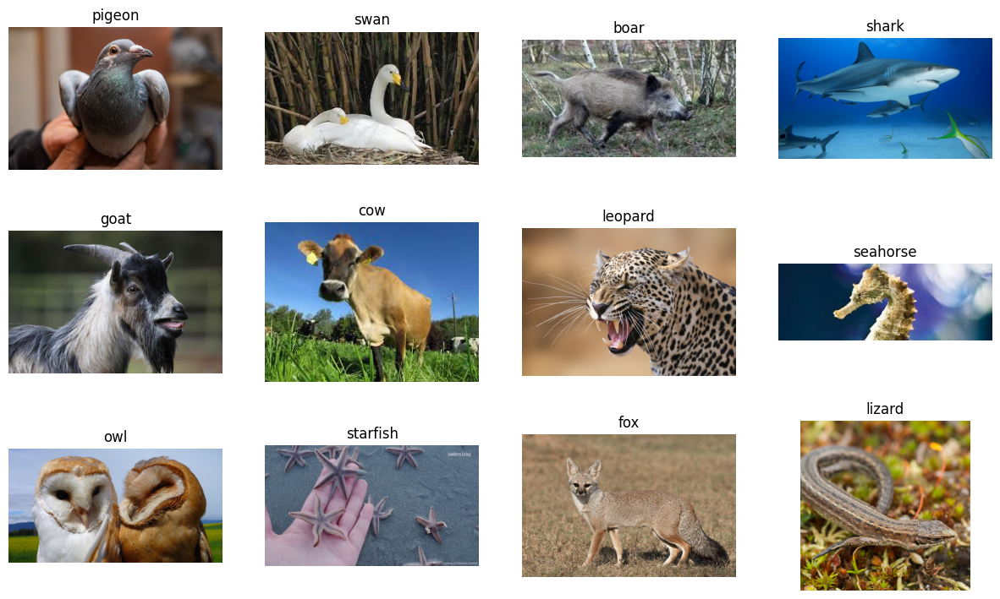

In [6]:
plot_image(train_df, 12)

# Configurations

In [7]:
class CFG: 
    
    # Name Animal 
    class_name = ['antelope', 'badger', 'bat', 'bear', 'bee', 'beetle', 'bison', 'boar', 'butterfly', 'cat', 'caterpillar',
                  'chimpanzee', 'cockroach', 'cow', 'coyote', 'crab', 'crow', 'deer', 'dog', 'dolphin', 'donkey', 'dragonfly',
                  'duck', 'eagle', 'elephant', 'flamingo', 'fly', 'fox', 'goat', 'goldfish', 'goose', 'gorilla', 'grasshopper',
                  'hamster', 'hare', 'hedgehog', 'hippopotamus', 'hornbill', 'horse', 'hummingbird', 'hyena', 'jellyfish', 'kangaroo',
                  'koala', 'ladybugs', 'leopard', 'lion', 'lizard', 'lobster','mosquito', 'moth', 'mouse', 'octopus', 'okapi', 'orangutan',
                  'otter', 'owl', 'ox', 'oyster', 'panda', 'parrot', 'pelecaniformes','penguin', 'pig', 'pigeon', 'porcupine', 'possum', 'raccoon', 'rat',
                  'reindeer', 'rhinoceros', 'sandpiper', 'seahorse', 'seal', 'shark','sheep', 'snake', 'sparrow', 'squid', 'squirrel', 'starfish',
                  'swan', 'tiger', 'turkey', 'turtle', 'whale', 'wolf', 'wombat', 'woodpecker', 'zebra']
    
    # Number of classes
    num_classes = len(set(train_df.labels))
    
    # IMAGE_SIZE
    IMAGE_SIZE = (224, 224)
    
    # Color 
    color_blue =  '#36609A'
    color_yellow = '#E5BA2B'
    
    # Random seed
    seed = 17


# Function Plot Training Model

In [8]:
def plot_training_model(history_model):
    
    # Size Plot
    fig,ax = plt.subplots(2,1,figsize = (8,8),dpi=100)
    fig.patch.set_facecolor('#f5f6f6')

    axes = ax.ravel()
    
    for ax in axes:
        ax.set_facecolor('#f5f6f6')
        for loc in ['right','top']:
            ax.spines[loc].set_visible(False)

    # Number Epochs
    hist = history_model.history
    Epochs = range(len(hist['loss']))
    
    # Line Traning Loss and Validation Loss
    sns.lineplot(x = Epochs,y=hist['val_loss'], ax = axes[0],linewidth = 4, color = CFG.color_blue)
    sns.lineplot(x = Epochs,y=hist['loss'],ax = axes[0],linewidth = 4,color = CFG.color_yellow)
    # Setting text Traning Loss and Validation Loss
    axes[0].text(Epochs[-1]+0.25,hist['val_loss'][-1],'Validation Loss',
                {'fontfamily': 'serif','size':12,'weight':'bold','color': CFG.color_blue})
    axes[0].text(Epochs[-1]+0.25,hist['loss'][-1],'Training Loss',
                 {'fontfamily':'serif','size':12,'weight':'bold','color': CFG.color_yellow})
    
    
    # Line Traning Accuracy and Validation Accuracy
    sns.lineplot(x = Epochs,y=hist['val_accuracy'],ax = axes[1],linewidth=4,color = CFG.color_blue)
    sns.lineplot(x = Epochs,y=hist['accuracy'],ax = axes[1],linewidth=4,color = CFG.color_yellow)
    # Setting text Traning Accuracy and Validation Accuracy
    axes[1].text(Epochs[-1]+0.25,hist['val_accuracy'][-1],'Validation Accuracy',
                 {'fontfamily':'serif','size':12,'weight':'bold','color': CFG.color_blue})
    axes[1].text(Epochs[-1]+0.25,hist['accuracy'][-1],'Training Accuracy',
                 {'fontfamily':'serif','size':12,'weight':'bold','color': CFG.color_yellow})

    # setting text plot
    fig.text(0,1.06, 'Loss and Accuracy',
             {'fontfamily':'serif','size':18,'weight':'bold'})
    fig.text(0,1.01,'As expected transfer learning did a good jod with a lomost negligable'
            + '\ndifference between validation and training loss and accuracies.',
             {'fontfamily':'serif','size':12})
    fig.text(0.75,-0.05,'Made by trinhminnhds/Kaggle',
             {'fontfamily':'serif','size':10,'color':'black'})

    plt.tight_layout(h_pad = 5)

    return fig.show()

# Function evaluate model

In [9]:
print(color.BOLD)
def evaluate_model(model_name,test_data):
    results = model_name.evaluate(test_data)
    print('Test Loss: {:.2f}%'.format(results[0]*100))
    print('Test Accuracy: {:.2f}%'.format(results[1]*100))

# Function evaluate f1score model 

In [10]:
def evaluate_f1score(model_name, test_data):
    y_true = test_data.classes
    y_pre = np.argmax(model_name.predict(test_data), axis=1)
    f1 = f1_score(y_true, y_pre, average= 'macro')
    print('F1 Score: {}'.format(f1))
    cr = classification_report(y_true, y_pre, target_names = test_data.class_indices.keys())
    return print(cr)

# Predictions on DataFrame

In [11]:
def predictions_dataframe(model_name, test_data):
    y_pre = np.argmax(model_name.predict(test_data),axis=1)
    classes = dict(zip(test_data.class_indices.values(),test_data.class_indices.keys()))
    Predictions = pd.DataFrame({'Image Index': list(range(len(test_data.labels))),
                               'Test Labels': test_data.labels,
                               'Test Classes': [classes[i] for i in test_data.labels],
                                'Prediction Labels': y_pre,
                                'Prediction Classes': [classes[i] for i in y_pre],
                                'Path': test_data.filenames,
                                'Prediction Probability': [x for x in np.asarray(tf.reduce_max(model_name.predict(test_data),axis = 1))]
                               })
    return Predictions

# Plot image predictions 

In [12]:
 def plot_predictions(Predictions):
    plt.figure(figsize=(20,20))
    for i,row in Predictions[Predictions['Test Labels'] != Predictions['Prediction Labels']].sort_values('Prediction Probability').tail(20).reset_index().iterrows():
        plt.subplot(5,4,i+1)
        image_path = row['Path']
        image = Image.open(image_path)
        plt.imshow(image)
        plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize= 12)
        plt.axis('off')

    return plt.show()

# Plot Heatmap

In [13]:
def plot_heatmap(model_name, test_data):
    preds = model_name.predict(test_data)
    y_pre = np.argmax(preds, axis=1)
    g_dict = test_data.class_indices
    classes = list(g_dict.keys())

    # Confusion matrix
    cm = confusion_matrix(test_data.classes, y_pre)

    plt.figure(figsize= (30, 30))
    plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()

    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation= 45)
    plt.yticks(tick_marks, classes)


    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')

    return plt.show()

# Setting a decay learning rate

In [14]:
print(color.BOLD_COLOR + '\nSetting a decay learning rate for learning rate schedule\n' + color.END)
epoch = 50
learning_rate = 4e-5
lr_start = 0.0005
lr_min = 0.00001
lr_max = 0.0005
lr_rampup_epochs = 1
lr_sustain_epochs = 1
lr_exp_decay = .8

def lrfn(epoch):
    if epoch < lr_rampup_epochs:
        lr = (lr_max - lr_start)/lr_rampup_epochs * epoch + lr_start
    elif epoch < lr_rampup_epochs + lr_sustain_epochs:
        lr = lr_max
    else:
        lr = (lr_max - lr_min) * lr_exp_decay**(epoch - lr_rampup_epochs - lr_sustain_epochs) + lr_min
    return lr

print(color.BOLD_COLOR + 'Done!' + color.END)


Setting a decay learning rate for learning rate schedule

Done!


# Visualizition Learning Rate

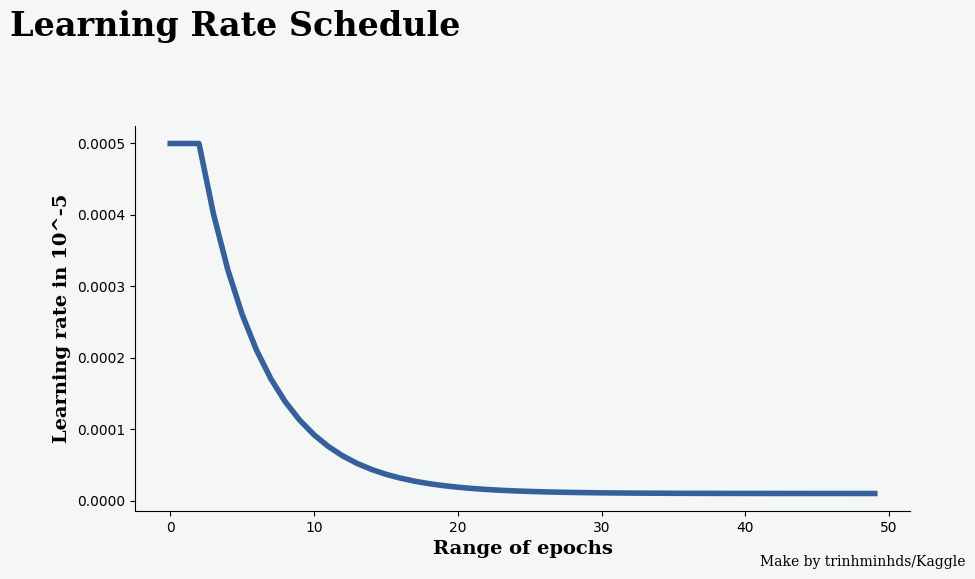

In [15]:
epochs = 20
epochs_range = [i for i in range(50 if epochs < 50 else epochs)]
learning_rate = [lrfn(x) for x in epochs_range]

fig,ax = plt.subplots(figsize = (10,5))
fig.patch.set_facecolor('#f5f6f6')
ax.set_facecolor('#f5f6f6')

for loc in ['right','top']:
    ax.spines[loc].set_visible(False)
    
ax.plot(epochs_range,learning_rate,linewidth = 4,color = CFG.color_blue)
plt.xlabel('Range of epochs',
           {'fontfamily':'serif','size':14,'color':'black','weight':'bold'})
plt.ylabel('Learning rate in 10^-5',
           {'fontfamily':'serif','size':14,'color':'black','weight':'bold'})

plt.gcf().text(0,1.06,'Learning Rate Schedule',
               {'fontfamily':'serif','size': 24,'color':'black','weight':'bold'})

plt.gcf().text(0.75,0,'Make by trinhminhds/Kaggle',
               {'fontfamily':'serif','size':10,'color':'black'})

plt.gcf().show()

# Setting Callbacks

In [17]:
print(color.BOLD_COLOR + '\nSetting early stopping facor and learning rate schedule\n' + color.END)

def get_callbacks(Erly_patince, Reduce_patince, Reduce_factor):
    callbacks = []
    lr_cb= LearningRateScheduler(lrfn,verbose=True)
    early= EarlyStopping(monitor = "val_loss",patience = Erly_patince ,restore_best_weights = True), 
    reduce= ReduceLROnPlateau(monitor='val_loss', factor= Reduce_factor, patience= Reduce_patince, mode='min')
    callbacks.extend([lr_cb, early, reduce]) # Add lr and stop, plateau cllbacks 
    return callbacks
    
print(color.BOLD_COLOR + 'Done!')


Setting early stopping facor and learning rate schedule

Done!


# ResNet50V2


In [20]:
# Setup confi
RESNE_VALIDATION_SIZE = 64
RESNET_BATCH_SIZE = 24
RESNET_CLASS_MODE = 'categorical'

# Processing dataset model Resnet50v2

In [21]:
%%time
print(color.BOLD)

resnet_generator = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 20,
    width_shift_range = 0.1,
    height_shift_range = 0.1,
    shear_range = 0.1,
    zoom_range = 0.1,
    fill_mode = 'nearest',
    horizontal_flip = True,
    vertical_flip = True,
)

train_resnest = resnet_generator.flow_from_dataframe(
    dataframe = train_df,
    x_col='imgpath',
    y_col='labels',
    target_size = CFG.IMAGE_SIZE,
    class_mode = RESNET_CLASS_MODE,
    batch_size = RESNET_BATCH_SIZE,
    shuffle = True,
    color_mode='rgb',
    seed= CFG.seed,
)


Found 3779 validated image filenames belonging to 90 classes.
CPU times: user 68.8 ms, sys: 62.1 ms, total: 131 ms
Wall time: 2.34 s


In [22]:
%%time
print(color.BOLD)

resnet_validation_generator = ImageDataGenerator(
    rescale = 1./255
)

validation_resnet = resnet_validation_generator.flow_from_dataframe(
    dataframe=valid_df,
    x_col='imgpath',
    y_col = 'labels',
    target_size= CFG.IMAGE_SIZE,
    class_mode= RESNET_CLASS_MODE,
    batch_size=RESNE_VALIDATION_SIZE,
    color_mode = 'rgb',
    shuffle = False,
)


test_resnet = resnet_validation_generator.flow_from_dataframe(
    dataframe= test_df,
    x_col = 'imgpath',
    y_col = 'labels',
    target_size= CFG.IMAGE_SIZE,
    class_mode = RESNET_CLASS_MODE,
    batch_size= RESNE_VALIDATION_SIZE,
    color_mode= 'rgb',
    shuffle = False,
)


Found 1134 validated image filenames belonging to 90 classes.
Found 487 validated image filenames belonging to 90 classes.
CPU times: user 36.7 ms, sys: 21.5 ms, total: 58.2 ms
Wall time: 683 ms


In [23]:
print(color.BOLD)
print(train_resnest.class_indices)
print(validation_resnet.class_indices)
print(test_resnet.class_indices)
print(color.END)


{'antelope': 0, 'badger': 1, 'bat': 2, 'bear': 3, 'bee': 4, 'beetle': 5, 'bison': 6, 'boar': 7, 'butterfly': 8, 'cat': 9, 'caterpillar': 10, 'chimpanzee': 11, 'cockroach': 12, 'cow': 13, 'coyote': 14, 'crab': 15, 'crow': 16, 'deer': 17, 'dog': 18, 'dolphin': 19, 'donkey': 20, 'dragonfly': 21, 'duck': 22, 'eagle': 23, 'elephant': 24, 'flamingo': 25, 'fly': 26, 'fox': 27, 'goat': 28, 'goldfish': 29, 'goose': 30, 'gorilla': 31, 'grasshopper': 32, 'hamster': 33, 'hare': 34, 'hedgehog': 35, 'hippopotamus': 36, 'hornbill': 37, 'horse': 38, 'hummingbird': 39, 'hyena': 40, 'jellyfish': 41, 'kangaroo': 42, 'koala': 43, 'ladybugs': 44, 'leopard': 45, 'lion': 46, 'lizard': 47, 'lobster': 48, 'mosquito': 49, 'moth': 50, 'mouse': 51, 'octopus': 52, 'okapi': 53, 'orangutan': 54, 'otter': 55, 'owl': 56, 'ox': 57, 'oyster': 58, 'panda': 59, 'parrot': 60, 'pelecaniformes': 61, 'penguin': 62, 'pig': 63, 'pigeon': 64, 'porcupine': 65, 'possum': 66, 'raccoon': 67, 'rat': 68, 'reindeer': 69, 'rhinoceros':

# Call model ResNet50v2

In [101]:
print(color.BOLD)
resnet50v2 = ResNet50V2(
    weights='imagenet',
    include_top=False,
    input_shape=(224,224,3)
)

In [102]:
# Running paramter False
for i , layer in enumerate(resnet50v2.layers):
    resnet50v2.layers[i].trainable = False

In [103]:
num_classes = len(set(train_resnest.classes))
print(num_classes)

90


## Plot Model ResNet50v2

In [ ]:
#plot_model(model_resnet50,show_shapes=True,expand_nested=True,dpi = 80)

# Model Building Resnet50v2

In [113]:
model_resnet50 = keras.models.Sequential([
    layers.Input(shape= (224,224,3)),
    resnet50v2,
    layers.Flatten(),
    layers.Dense(256,activation = 'relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.6),
    layers.Dense(num_classes ,activation = 'softmax')
])

#model_resnet50.build(input_shape=(None, 224, 224, 3))

print(color.BOLD_COLOR + '\nVanilla Model layers and output shapes with params...\n'+color.END)

print(color.BOLD)
model_resnet50.summary()


Vanilla Model layers and output shapes with params...




Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50v2 (Functional)         │ (None, 7, 7, 2048)     │    23,564,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_18 (Flatten)            │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 256)            │    25,690,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_24 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 90)             │        23,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,279,322 (187.99 MB)

 Trainable params: 25,714,010 (98.09 MB)

 Non-trainable params: 23,565,312 (89.89 MB)

In [114]:
model_resnet50.compile(
    optimizer= Adam(0.0001),
    loss= keras.losses.CategoricalCrossentropy(from_logits=False),
    metrics= ['accuracy']
)

In [115]:
print(color.BOLD)
history_resnet50 = model_resnet50.fit(
    train_resnest,
    validation_data= validation_resnet,
    epochs = 15,
    callbacks= [
        EarlyStopping(monitor = "val_loss",patience = 3,restore_best_weights = True), 
        # if val loss decreases for numbers epochs in a row, stop training,
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min') 
    ]
)


Epoch 1/15
  1/158 ━━━━━━━━━━━━━━━━━━━━ 47:46 18s/step - accuracy: 0.0000e+00 - loss: 6.0976

I0000 00:00:1718809144.034223      87 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


158/158 ━━━━━━━━━━━━━━━━━━━━ 106s 557ms/step - accuracy: 0.1463 - loss: 4.4226 - val_accuracy: 0.6746 - val_loss: 1.2921 - learning_rate: 1.0000e-04
Epoch 2/15
158/158 ━━━━━━━━━━━━━━━━━━━━ 65s 394ms/step - accuracy: 0.4990 - loss: 2.1120 - val_accuracy: 0.7487 - val_loss: 0.9659 - learning_rate: 1.0000e-04
Epoch 3/15
158/158 ━━━━━━━━━━━━━━━━━━━━ 61s 366ms/step - accuracy: 0.6033 - loss: 1.6465 - val_accuracy: 0.7804 - val_loss: 0.8293 - learning_rate: 1.0000e-04
Epoch 4/15
158/158 ━━━━━━━━━━━━━━━━━━━━ 60s 364ms/step - accuracy: 0.6765 - loss: 1.3241 - val_accuracy: 0.7954 - val_loss: 0.7785 - learning_rate: 1.0000e-04
Epoch 5/15
158/158 ━━━━━━━━━━━━━━━━━━━━ 60s 365ms/step - accuracy: 0.7124 - loss: 1.1839 - val_accuracy: 0.8104 - val_loss: 0.7096 - learning_rate: 1.0000e-04
Epoch 6/15
158/158 ━━━━━━━━━━━━━━━━━━━━ 60s 367ms/step - accuracy: 0.7540 - loss: 1.0141 - val_accuracy: 0.8316 - val_loss: 0.6813 - learning_rate: 1.0000e-04
Epoch 7/15
158/158 ━━━━━━━━━━━━━━━━━━━━ 60s 368ms/step -

In [117]:
evaluate_model(model_resnet50, test_resnet)

8/8 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.8498 - loss: 0.5690 
Test Loss: 55.13%
Test Accuracy: 85.63%


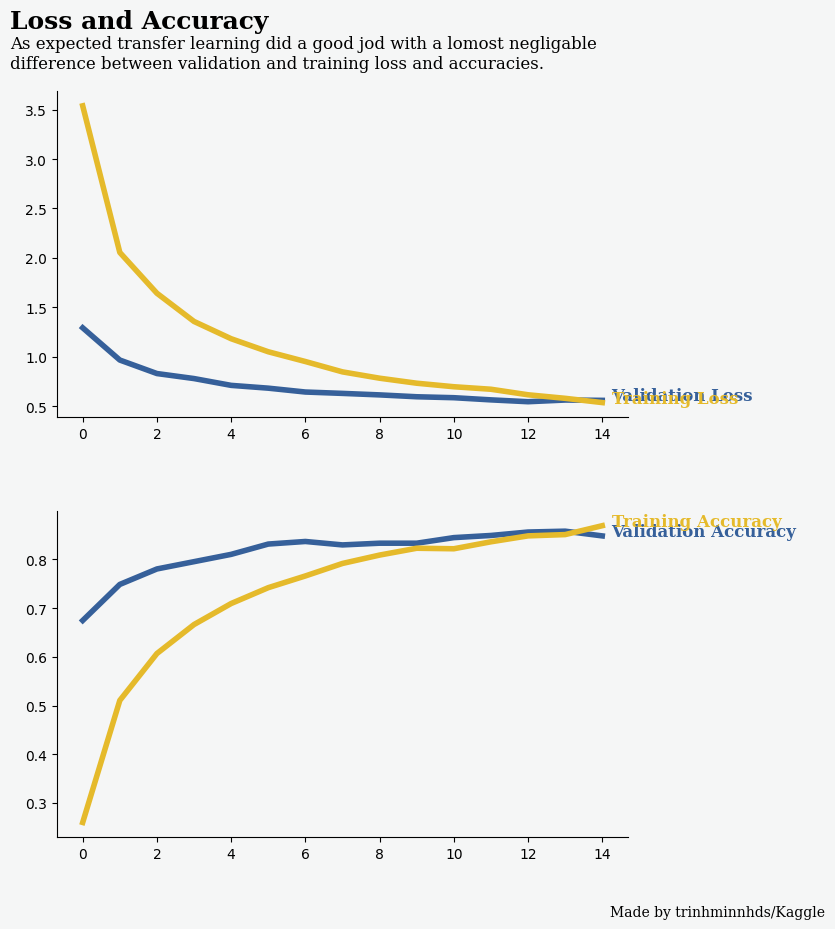

In [119]:
plot_training_model(history_resnet50)

In [123]:
evaluate_f1score(model_resnet50, test_resnet)

8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 367ms/step
F1 Score: 0.009691358024691357
                precision    recall  f1-score   support

      antelope       0.00      0.00      0.00         5
        badger       0.00      0.00      0.00         7
           bat       0.00      0.00      0.00         3
          bear       0.00      0.00      0.00         4
           bee       0.00      0.00      0.00         5
        beetle       0.00      0.00      0.00         4
         bison       0.00      0.00      0.00         4
          boar       0.00      0.00      0.00         3
     butterfly       0.00      0.00      0.00         4
           cat       0.14      0.12      0.13         8
   caterpillar       0.00      0.00      0.00         2
    chimpanzee       0.00      0.00      0.00         7
     cockroach       0.00      0.00      0.00         7
           cow       0.00      0.00      0.00         3
        coyote       0.00      0.00      0.00         6
          crab       0.00      0.

In [131]:
Predictions = predictions_dataframe(model_resnet50, test_resnet)
Predictions

8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 382ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 454ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,53,okapi,18,dog,/kaggle/input/animal-image-dataset-90-differen...,0.939600
1,1,83,turkey,11,chimpanzee,/kaggle/input/animal-image-dataset-90-differen...,0.901685
2,2,74,shark,87,wombat,/kaggle/input/animal-image-dataset-90-differen...,0.791648
3,3,44,ladybugs,72,seahorse,/kaggle/input/animal-image-dataset-90-differen...,0.996028
4,4,57,ox,80,starfish,/kaggle/input/animal-image-dataset-90-differen...,0.976595
...,...,...,...,...,...,...,...
482,482,62,penguin,9,cat,/kaggle/input/animal-image-dataset-90-differen...,0.992981
483,483,36,hippopotamus,77,sparrow,/kaggle/input/animal-image-dataset-90-differen...,0.476030
484,484,71,sandpiper,45,leopard,/kaggle/input/animal-image-dataset-90-differen...,0.735156
485,485,28,goat,69,reindeer,/kaggle/input/animal-image-dataset-90-differen...,0.772822


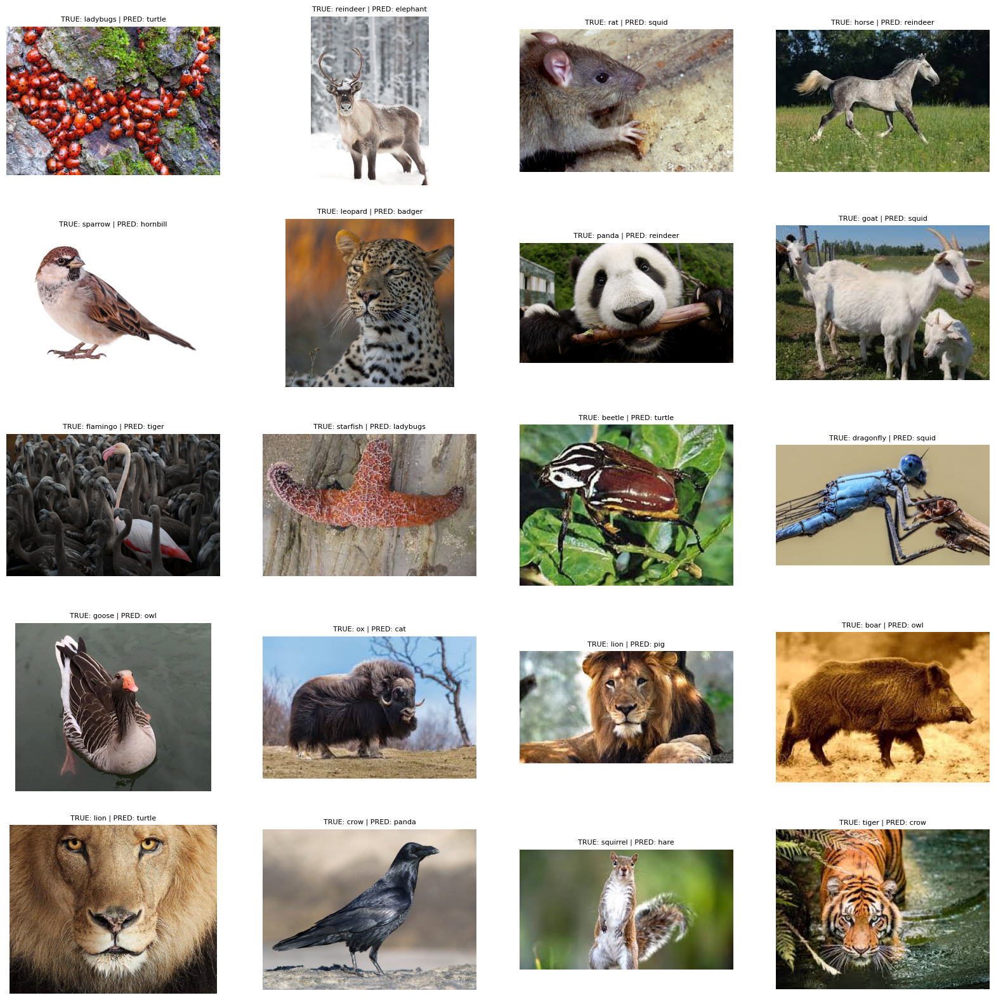

In [133]:
plot_predictions(Predictions)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
2
bat


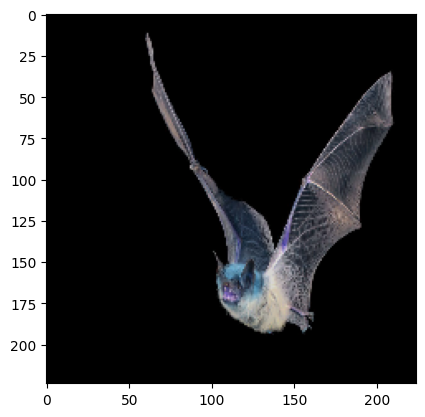

In [134]:
test_img = cv2.imread('/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/bat/0315a4b6b7.jpg')

test_img_resized = cv2.resize(test_img, (224, 224)) #resize image to (224,224)
test_input = np.array(test_img_resized) # covert to array
test_input = np.expand_dims(test_input, axis=0) # e_dims (224,224,3)
test_input = test_input / 255.0 # scaled [0 to 1]
y_pre = model_resnet50.predict(test_input) # Predic
y_classes = [np.argmax(y_pre)][0] # softmax values  

print(y_classes) # print list predict
print(CFG.class_name[y_classes]) # print name animal 

plt.imshow(test_img_resized) # plot image 
plt.show()

In [ ]:
#model_resnet50.save('model_resnet50_animal_90_ver2.h5')

# EfficientNetB3

In [105]:
%%time
print(color.BOLD) # Bold 

# Batch size 
EFF_BATCH_SIZE = 15

# Using preprocessing_input with model efficiennet
EfficentNetB3_generator = ImageDataGenerator(
    preprocessing_function = tf.keras.applications.efficientnet.preprocess_input,
)

# Split the data into three categories.(Train, Val, Test)
train_eff = EfficentNetB3_generator.flow_from_dataframe(
    dataframe= train_df,
    x_col= 'imgpath',
    y_col= 'labels',
    target_size= CFG.IMAGE_SIZE,
    color_mode= 'rgb',
    class_mode= 'categorical',
    batch_size= EFF_BATCH_SIZE,
    shuffle= True,
    seed= CFG.seed,
)

val_eff = EfficentNetB3_generator.flow_from_dataframe(
    dataframe= valid_df,
    x_col= 'imgpath',
    y_col= 'labels',
    target_size= CFG.IMAGE_SIZE,
    color_mode= 'rgb',
    class_mode= 'categorical',
    batch_size= EFF_BATCH_SIZE,
    shuffle= False,
)

test_eff = EfficentNetB3_generator.flow_from_dataframe(
    dataframe= test_df,
    x_col= 'imgpath',
    y_col= 'labels',
    target_size= CFG.IMAGE_SIZE,
    color_mode= 'rgb',
    class_mode= 'categorical',
    batch_size= EFF_BATCH_SIZE,
    shuffle= False,
)


Found 3779 validated image filenames belonging to 90 classes.
Found 1134 validated image filenames belonging to 90 classes.
Found 487 validated image filenames belonging to 90 classes.
CPU times: user 121 ms, sys: 67.8 ms, total: 189 ms
Wall time: 2.72 s


In [70]:
print(color.BOLD)
# Load the model
eff_model = tf.keras.applications.EfficientNetB3(
    input_shape=(224, 224, 3),
    include_top= False, # we don`t need a pre-trained top layer (output layer)
    weights= 'imagenet',
    pooling= 'max'
)

for i ,layer in enumerate(eff_model.layers):
    eff_model.layers[i].trainable = False

In [71]:
num_classes = len(set(train_eff.classes))
print(num_classes)

90


In [76]:
# setup augment for Image
augment = keras.Sequential([
layers.RandomFlip('horizontal'),
layers.RandomRotation(0.1),
layers.RandomZoom(0.1),
layers.RandomContrast(0.1),
], name='AugmentationLayer')

inputs = layers.Input(shape = (224,224,3), name= 'inputsLayers')
x = augment(inputs)
x = eff_model(x, training = False)
x = Dense(368, activation = 'relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
outputs = Dense(num_classes, activation= 'softmax', dtype= tf.float32)(x)
# Mixed_precisons need separater Den and Activation layers
model_efficientnet = Model(inputs = inputs, outputs = outputs)

print(color.BOLD)
print(model_efficientnet.summary())

Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inputsLayers (InputLayer)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ AugmentationLayer (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb3 (Functional)     │ (None, 1536)           │    10,783,535 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 368)            │       565,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 368)            │         1,472 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 368)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 90)             │        33,210 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,383,833 (43.43 MB)

 Trainable params: 599,562 (2.29 MB)

 Non-trainable params: 10,784,271 (41.14 MB)

None


In [77]:
model_efficientnet.compile(
    optimizer=Adam(0.0005),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [78]:
history_efficientnet = model_efficientnet.fit( 
    train_eff,
    validation_data= val_eff,
    epochs= 15,
    callbacks= [
        EarlyStopping(monitor = "val_loss",patience = 3,restore_best_weights = True), 
        # if val loss decreases for numbers epochs in a row, stop training,
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min') 
    ] 
)

Epoch 1/15


2024-06-20 16:56:12.121715: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/functional_14_1/efficientnetb3_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


252/252 ━━━━━━━━━━━━━━━━━━━━ 55s 140ms/step - accuracy: 0.2610 - loss: 3.5732 - val_accuracy: 0.7840 - val_loss: 0.8601 - learning_rate: 5.0000e-04
Epoch 2/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - accuracy: 0.7481 - loss: 1.0859 - val_accuracy: 0.8545 - val_loss: 0.5385 - learning_rate: 5.0000e-04
Epoch 3/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - accuracy: 0.8217 - loss: 0.7110 - val_accuracy: 0.8633 - val_loss: 0.4841 - learning_rate: 5.0000e-04
Epoch 4/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - accuracy: 0.8576 - loss: 0.5788 - val_accuracy: 0.8686 - val_loss: 0.4718 - learning_rate: 5.0000e-04
Epoch 5/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 31s 122ms/step - accuracy: 0.8651 - loss: 0.5300 - val_accuracy: 0.8748 - val_loss: 0.4301 - learning_rate: 5.0000e-04
Epoch 6/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - accuracy: 0.8812 - loss: 0.4694 - val_accuracy: 0.8862 - val_loss: 0.4180 - learning_rate: 5.0000e-04
Epoch 7/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - 

In [79]:
evaluate_model(model_efficientnet, test_eff)

33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.8931 - loss: 0.4472
Test Loss: 38.29%
Test Accuracy: 90.76%


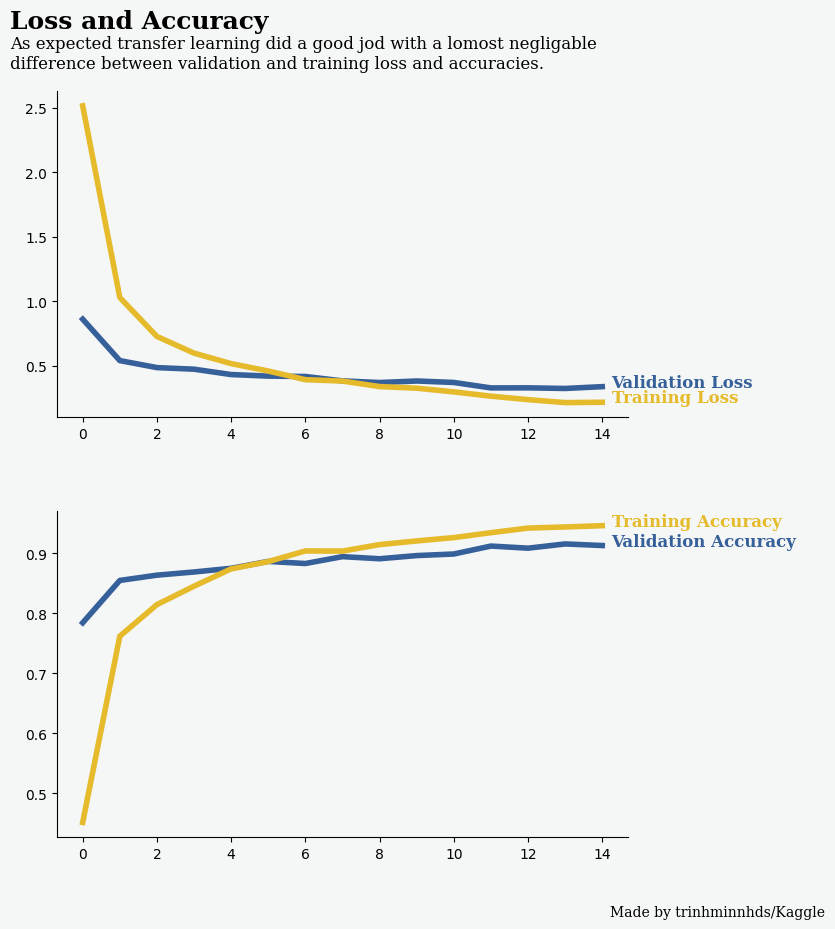

In [80]:
plot_training_model(history_efficientnet)

In [144]:
# model.save('model1_animal_90.h5')

In [89]:
eff_model.trainable = True

# set BatchNorm layers as not trainable
for layer in eff_model.layers:
    if isinstance(layer, layers.BatchNormalization): 
        layer.trainable = False
        
# let`s see first 10 layers
for l in eff_model.layers[:5]:
    print(l.name, l.trainable)

    
model_efficientnet.compile(
    optimizer = Adam(0.0001),
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

model_efficientnet.summary()

Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inputsLayers (InputLayer)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ AugmentationLayer (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb3 (Functional)     │ (None, 1536)           │    10,783,535 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 368)            │       565,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 368)            │         1,472 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 368)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 90)             │        33,210 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,383,833 (43.43 MB)

 Trainable params: 599,562 (2.29 MB)

 Non-trainable params: 10,784,271 (41.14 MB)

In [90]:
history_efficientnet = model_efficientnet.fit(
    train_eff,
    validation_data = val_eff,
    epochs = 15,
    callbacks=[
        EarlyStopping(monitor = "val_loss",patience = 3,restore_best_weights= True), 
        ReduceLROnPlateau(monitor='val_loss', factor= 0.2, patience= 2, mode='min') 
    ]
)

Epoch 1/15


2024-06-20 17:16:46.589075: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/functional_14_1/efficientnetb3_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


252/252 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - accuracy: 0.9540 - loss: 0.1875 - val_accuracy: 0.9065 - val_loss: 0.3338 - learning_rate: 1.0000e-04
Epoch 2/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 33s 128ms/step - accuracy: 0.9542 - loss: 0.1817 - val_accuracy: 0.9092 - val_loss: 0.3333 - learning_rate: 1.0000e-04
Epoch 3/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - accuracy: 0.9529 - loss: 0.1821 - val_accuracy: 0.9101 - val_loss: 0.3164 - learning_rate: 1.0000e-04
Epoch 4/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - accuracy: 0.9547 - loss: 0.1871 - val_accuracy: 0.9039 - val_loss: 0.3304 - learning_rate: 1.0000e-04
Epoch 5/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 31s 121ms/step - accuracy: 0.9590 - loss: 0.1612 - val_accuracy: 0.9056 - val_loss: 0.3261 - learning_rate: 1.0000e-04
Epoch 6/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - accuracy: 0.9549 - loss: 0.1783 - val_accuracy: 0.9101 - val_loss: 0.3194 - learning_rate: 2.0000e-05


In [108]:
evaluate_model(model_efficientnet, test_eff)

33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - accuracy: 0.8970 - loss: 0.4160
Test Loss: 36.83%
Test Accuracy: 89.73%


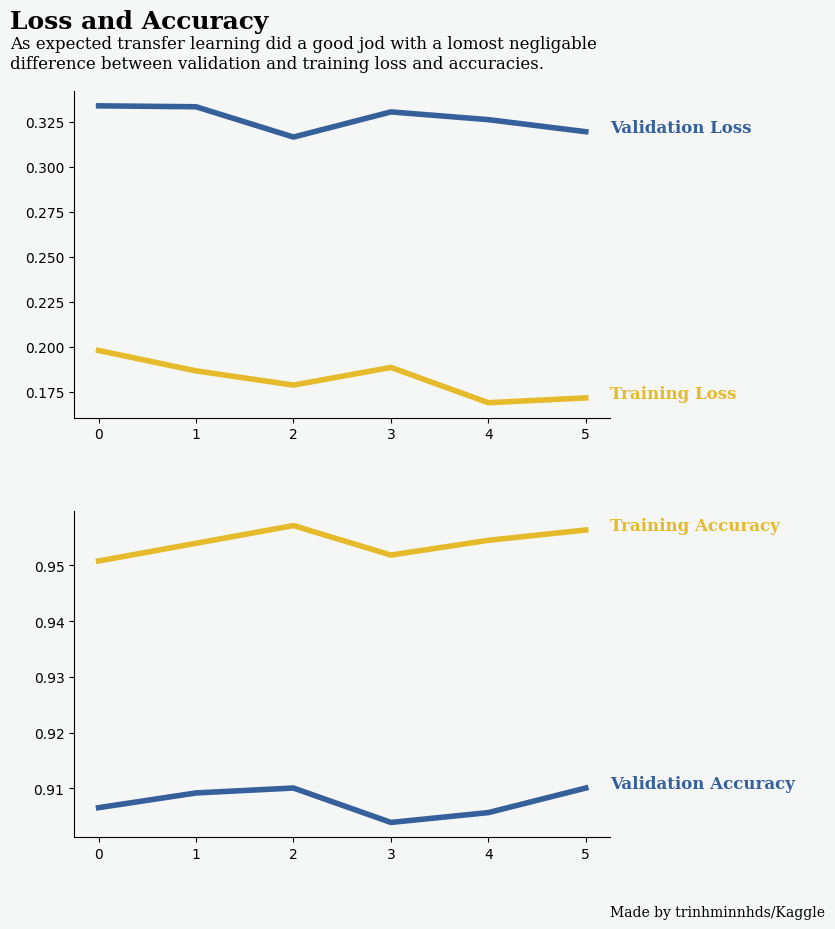

In [97]:
plot_training_model(history_efficientnet)

In [ ]:
#model_efficientnet.save('model_efficientnet_90_animal_update20_6.h5')

In [106]:
evaluate_f1score(model_efficientnet, test_eff)

33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step
F1 Score: 0.89178847773791
                precision    recall  f1-score   support

      antelope       0.83      1.00      0.91         5
        badger       1.00      1.00      1.00         7
           bat       0.67      0.67      0.67         3
          bear       1.00      1.00      1.00         4
           bee       1.00      0.80      0.89         5
        beetle       0.80      1.00      0.89         4
         bison       0.75      0.75      0.75         4
          boar       0.75      1.00      0.86         3
     butterfly       1.00      1.00      1.00         4
           cat       1.00      0.75      0.86         8
   caterpillar       1.00      0.50      0.67         2
    chimpanzee       1.00      0.86      0.92         7
     cockroach       1.00      1.00      1.00         7
           cow       1.00      1.00      1.00         3
        coyote       1.00      1.00      1.00         6
          crab       1.00      1.00 

In [100]:
# Kiểm tra độ dài của mỗi mảng
def check_length_array(model_name, test_data):
    y_pre = np.argmax(model_name.predict(test_data),axis=1)
    classes = dict(zip(test_data.class_indices.values(),test_data.class_indices.keys()))
    print("Image Index length:", len(list(range(len(test_data)))))
    print("Test Labels length:", len(test_data.labels))
    print("Test Classes length:", len([classes[i] for i in test_data.labels]))
    print("Prediction Labels length:", len(y_pre))
    print("Prediction Classes length:", len([classes[i] for i in y_pre]))
    print("Path length:", len(test_data.filenames))
    print("Prediction Probability length:", len([x for x in np.asarray(tf.reduce_max(model_name.predict(test_data), axis=1))]))

    
check_length_array(model_efficientnet, test_eff)

33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step
Image Index length: 33
Test Labels length: 487
Test Classes length: 487
Prediction Labels length: 487
Prediction Classes length: 487
Path length: 487
33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step
Prediction Probability length: 487


In [109]:
Predictions = predictions_dataframe(model_efficientnet, test_eff)
Predictions

33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,53,okapi,53,okapi,/kaggle/input/animal-image-dataset-90-differen...,0.938629
1,1,83,turkey,83,turkey,/kaggle/input/animal-image-dataset-90-differen...,0.996719
2,2,74,shark,74,shark,/kaggle/input/animal-image-dataset-90-differen...,0.959243
3,3,44,ladybugs,44,ladybugs,/kaggle/input/animal-image-dataset-90-differen...,0.999982
4,4,57,ox,57,ox,/kaggle/input/animal-image-dataset-90-differen...,0.974324
...,...,...,...,...,...,...,...
482,482,62,penguin,62,penguin,/kaggle/input/animal-image-dataset-90-differen...,0.998968
483,483,36,hippopotamus,36,hippopotamus,/kaggle/input/animal-image-dataset-90-differen...,0.999393
484,484,71,sandpiper,71,sandpiper,/kaggle/input/animal-image-dataset-90-differen...,0.999747
485,485,28,goat,28,goat,/kaggle/input/animal-image-dataset-90-differen...,0.772761


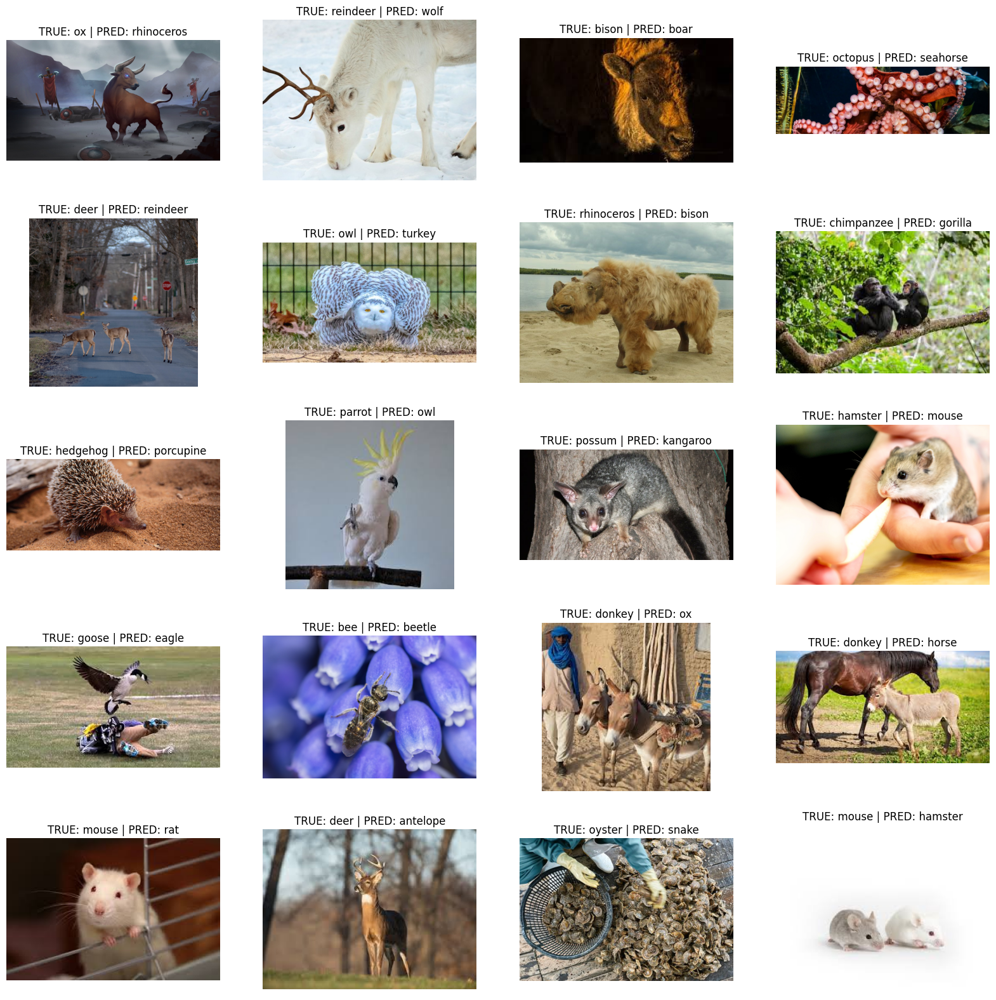

In [110]:
plot_predictions(Predictions)

33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step


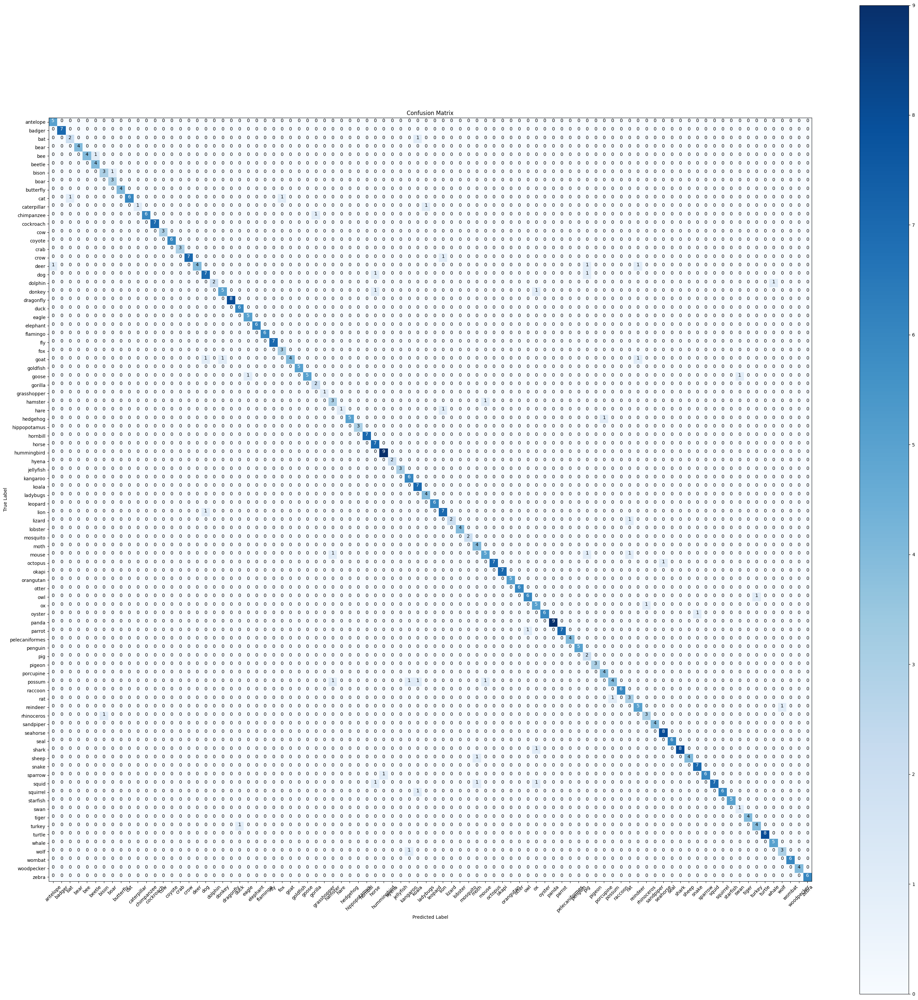

In [111]:
plot_heatmap(model_efficientnet, test_eff)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Name Animal:  bat


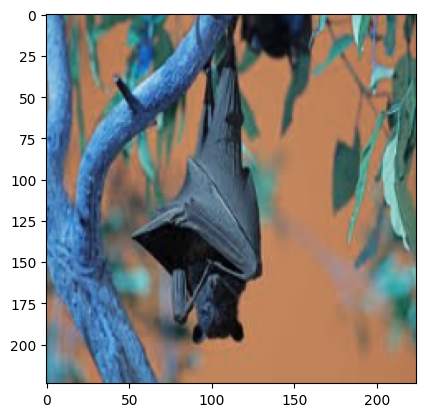

In [165]:
# Load test image
test_img = cv2.imread('/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/bat/330e4a8053.jpg')
# Resize test image to match model input size (224x224)
test_img_resized = cv2.resize(test_img, (224, 224))
# Convert test image to numpy array
test_input = keras.applications.efficientnet.preprocess_input(test_img_resized)
# Expand dimensions to match model input shape (add batch dimension)
test_input = np.expand_dims(test_input, axis=0)
# Predict
y_pre = model_efficientnet.predict(test_input)
# Get predicted class
y_classes = np.argmax(y_pre)
# Print predicted class
print('Name Animal: ', CFG.class_name[y_classes])
# Display the test image
plt.imshow(test_img_resized)
plt.show()

# Model VGG16

In [15]:
from keras.applications import VGG16

In [50]:
%%time
print(color.BOLD)
EFF_BATCH_SIZE = 15

VGG16_generator = ImageDataGenerator(
    preprocessing_function = tf.keras.applications.vgg16.preprocess_input,
)

# Split the data into three categories.
train_vgg16 = VGG16_generator.flow_from_dataframe(
    dataframe= train_df,
    x_col= 'imgpath',
    y_col= 'labels',
    target_size= CFG.IMAGE_SIZE,
    color_mode= 'rgb',
    class_mode= 'categorical',
    batch_size= EFF_BATCH_SIZE,
    shuffle= True,
    seed= CFG.seed,
)

val_vgg16 = VGG16_generator.flow_from_dataframe(
    dataframe= valid_df,
    x_col= 'imgpath',
    y_col= 'labels',
    target_size= CFG.IMAGE_SIZE,
    color_mode= 'rgb',
    class_mode= 'categorical',
    batch_size= EFF_BATCH_SIZE,
    shuffle= False
)

test_vgg16 = VGG16_generator.flow_from_dataframe(
    dataframe= test_df,
    x_col= 'imgpath',
    y_col= 'labels',
    target_size= CFG.IMAGE_SIZE,
    color_mode= 'rgb',
    class_mode= 'categorical',
    batch_size= EFF_BATCH_SIZE,
    shuffle= False
)


Found 3779 validated image filenames belonging to 90 classes.
Found 1134 validated image filenames belonging to 90 classes.
Found 487 validated image filenames belonging to 90 classes.
CPU times: user 62.7 ms, sys: 128 ms, total: 191 ms
Wall time: 3.41 s


In [51]:
vgg16_model = VGG16(
    include_top = False,
    input_shape = (224, 224,3),
    weights = 'imagenet',
    pooling = 'max'
)

for i ,layer in enumerate(vgg16_model.layers):
    vgg16_model.layers[i].trainable = False

In [52]:
num_classes = len(set(train_vgg16.classes))
print(num_classes)

90


In [53]:
augment = keras.Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.15),
    layers.RandomZoom(0.15),
    layers.RandomContrast(0.15),
], name='AugmentationLayer')


inputs = layers.Input(shape = (224,224,3), name= 'inputsLayers')
x = augment(inputs)
x = vgg16_model(x, training = False)
x = layers.Flatten()(x)
x = Dense(268, activation = 'relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
outputs = Dense(num_classes, activation = 'softmax', dtype = tf.float32)(x)
model_vgg16 = Model(inputs = inputs, outputs = outputs)

print(color.BOLD)
print(model_vgg16.summary())

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inputsLayers (InputLayer)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ AugmentationLayer (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 512)            │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 268)            │       137,484 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 268)            │         1,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 268)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 90)             │        24,210 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,877,454 (56.75 MB)

 Trainable params: 162,230 (633.71 KB)

 Non-trainable params: 14,715,224 (56.13 MB)

None


In [54]:
model_vgg16.compile(
    optimizer = Adam(0.0005),
    loss = keras.losses.CategoricalCrossentropy(from_logits= False),
    metrics = ['accuracy']
)

In [23]:
history = model_vgg16.fit(
    train_vgg16,
    validation_data = val_vgg16,
    epochs = 15,
    callbacks=[
        EarlyStopping(monitor = "val_loss",patience= 3,restore_best_weights = True), 
        ReduceLROnPlateau(monitor= 'val_loss', factor= 0.3, patience= 2, mode= 'min') 
    ]
)

Epoch 1/15


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


237/237 ━━━━━━━━━━━━━━━━━━━━ 77s 281ms/step - accuracy: 0.0396 - loss: 4.9331 - val_accuracy: 0.2231 - val_loss: 4.2670 - learning_rate: 5.0000e-04
Epoch 2/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 34s 139ms/step - accuracy: 0.2185 - loss: 3.3727 - val_accuracy: 0.3836 - val_loss: 3.1147 - learning_rate: 5.0000e-04
Epoch 3/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - accuracy: 0.3242 - loss: 2.7984 - val_accuracy: 0.4594 - val_loss: 2.6563 - learning_rate: 5.0000e-04
Epoch 4/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - accuracy: 0.4171 - loss: 2.4076 - val_accuracy: 0.5273 - val_loss: 2.5468 - learning_rate: 5.0000e-04
Epoch 5/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 34s 138ms/step - accuracy: 0.4828 - loss: 2.1279 - val_accuracy: 0.5467 - val_loss: 2.6120 - learning_rate: 5.0000e-04
Epoch 6/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 35s 143ms/step - accuracy: 0.5274 - loss: 1.9472 - val_accuracy: 0.5996 - val_loss: 2.2636 - learning_rate: 5.0000e-04
Epoch 7/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 34s 141ms/step - 

In [24]:
vgg16_model.trainable = True

# set BatchNorm layers as not trainable
for layer in vgg16_model.layers:
    if isinstance(layer, layers.BatchNormalization): 
        layer.trainable = False
        
# let`s see first 10 layers
for l in vgg16_model.layers[:20]:
    print(l.name, l.trainable)

input_layer False
block1_conv1 False
block1_conv2 False
block1_pool False
block2_conv1 False
block2_conv2 False
block2_pool False
block3_conv1 False
block3_conv2 False
block3_conv3 False
block3_pool False
block4_conv1 False
block4_conv2 False
block4_conv3 False
block4_pool False
block5_conv1 False
block5_conv2 False
block5_conv3 False
block5_pool False
global_max_pooling2d False


In [30]:
model_vgg16.compile(
    optimizer = Adam(0.00001),
    loss = keras.losses.CategoricalCrossentropy(from_logits= False),
    metrics = ['accuracy']
)

model_vgg16.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inputsLayers (InputLayer)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ AugmentationLayer (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 512)            │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 90)             │        23,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,870,170 (56.73 MB)

 Trainable params: 154,970 (605.35 KB)

 Non-trainable params: 14,715,200 (56.13 MB)

In [31]:
history_vgg16 = model_vgg16.fit(
    train_vgg16,
    validation_data = val_vgg16,
    epochs = 15,
    callbacks=[
        EarlyStopping(monitor = "val_loss",patience= 3,restore_best_weights = True), 
        ReduceLROnPlateau(monitor= 'val_loss', factor= 0.3, patience= 2, mode= 'min') 
    ]
)

Epoch 1/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 38s 148ms/step - accuracy: 0.6976 - loss: 1.1329 - val_accuracy: 0.6949 - val_loss: 1.6280 - learning_rate: 1.0000e-05
Epoch 2/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - accuracy: 0.7081 - loss: 1.1563 - val_accuracy: 0.6931 - val_loss: 1.7641 - learning_rate: 1.0000e-05
Epoch 3/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - accuracy: 0.6950 - loss: 1.1621 - val_accuracy: 0.6966 - val_loss: 1.7676 - learning_rate: 1.0000e-05
Epoch 4/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - accuracy: 0.6913 - loss: 1.1871 - val_accuracy: 0.6966 - val_loss: 1.4209 - learning_rate: 3.0000e-06
Epoch 5/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 34s 141ms/step - accuracy: 0.7179 - loss: 1.1407 - val_accuracy: 0.6940 - val_loss: 1.5781 - learning_rate: 3.0000e-06
Epoch 6/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - accuracy: 0.7196 - loss: 1.0921 - val_accuracy: 0.6966 - val_loss: 1.3634 - learning_rate: 3.0000e-06
Epoch 7/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 35s 14

In [32]:
evaluate_model(model_vgg16, test_vgg16)

 1/31 ━━━━━━━━━━━━━━━━━━━━ 5s 172ms/step - accuracy: 0.7500 - loss: 1.3701

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


31/31 ━━━━━━━━━━━━━━━━━━━━ 9s 287ms/step - accuracy: 0.6871 - loss: 1.4816
Test Loss: 136.54%
Test Accuracy: 67.76%


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

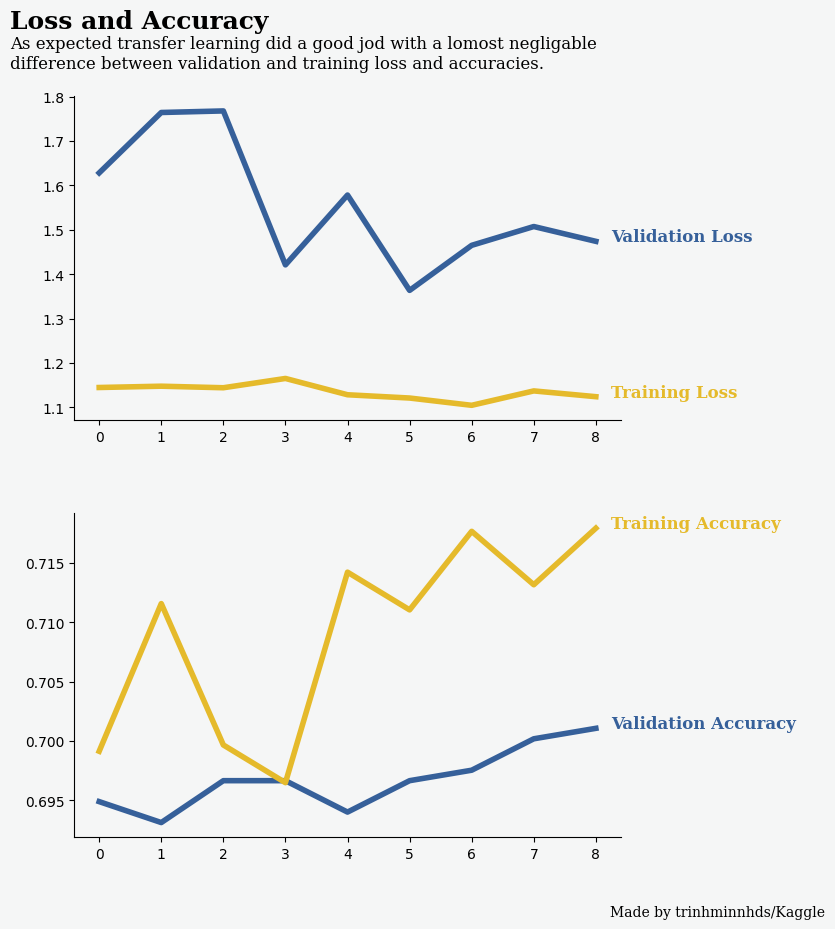

In [33]:
plot_training_model(history_vgg16)

# Model EfficienNetB7

![](https://raw.githubusercontent.com/tensorflow/tpu/master/models/official/efficientnet/g3doc/params.png)

In [18]:
%%time
print(color.BOLD)
EFFB7_BATCH_SIZE = 15

EfficentNetB7_generator = ImageDataGenerator(
    preprocessing_function= tf.keras.applications.efficientnet.preprocess_input,
)

# Train the data into three categorical train, valid, test 
train_effb7 = EfficentNetB7_generator.flow_from_dataframe(
    dataframe= train_df,
    x_col = 'imgpath',
    y_col = 'labels',
    target_size = CFG.IMAGE_SIZE,
    color_mode = 'rgb',
    class_mode = 'categorical',
    batch_size = EFFB7_BATCH_SIZE,
    shuffle= True,
    seed = CFG.seed,
)

valid_effb7 = EfficentNetB7_generator.flow_from_dataframe(
    dataframe = valid_df,
    x_col = 'imgpath',
    y_col = 'labels',
    target_size= CFG.IMAGE_SIZE,
    color_mode = 'rgb',
    class_mode = 'categorical',
    batch_size = EFFB7_BATCH_SIZE,
    shuffle= False,
)

test_effb7 = EfficentNetB7_generator.flow_from_dataframe(
    dataframe = test_df,
    x_col = 'imgpath',
    y_col = 'labels',
    target_size = CFG.IMAGE_SIZE,
    color_mode = 'rgb',
    class_mode = 'categorical',
    batch_size = EFFB7_BATCH_SIZE,
    shuffle = False,
)


Found 3779 validated image filenames belonging to 90 classes.
Found 1134 validated image filenames belonging to 90 classes.
Found 487 validated image filenames belonging to 90 classes.
CPU times: user 99.5 ms, sys: 94.4 ms, total: 194 ms
Wall time: 3.03 s


In [19]:
print(color.BOLD)

effb7_model = keras.applications.EfficientNetB7(
    input_shape = (224, 224, 3),
    include_top = False,
    weights = 'imagenet',
    pooling = 'max'
)


258076736/258076736 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [20]:
for i , layer in enumerate(effb7_model.layers):
    effb7_model.layers[i].trainable = False

In [23]:
# Setup parameter Model
augment = keras.Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
], name='AugmentationLayer')

inputs = layers.Input(shape = (224,224,3), name = 'InputLayers')
x = augment(inputs)
x = effb7_model(x , training = False)
x = Dense(368, activation = 'relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.6)(x)
outputs = Dense(CFG.num_classes, activation= 'softmax', dtype= tf.float32, name = 'OutputLayers')(x)
model_efficienetB7 = Model(inputs, outputs)

# Print table Parameter Model
model_efficienetB7.summary()

# Model compile
model_efficienetB7.compile(
    optimizer = keras.optimizers.Adam(0.0005),
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ InputLayers (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ AugmentationLayer (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb7 (Functional)     │ (None, 2560)           │    64,097,687 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 368)            │       942,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 368)            │         1,472 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 368)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ OutputLayers (Dense)            │ (None, 90)             │        33,210 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 65,074,817 (248.24 MB)

 Trainable params: 976,394 (3.72 MB)

 Non-trainable params: 64,098,423 (244.52 MB)

In [24]:
# Model Fit
history_efficienetB7 = model_efficienetB7.fit(
    train_effb7, 
    validation_data= valid_effb7,
    epochs = 15,
    callbacks= [
        EarlyStopping(monitor= 'val_loss', patience= 3, restore_best_weights= True),
        ReduceLROnPlateau(monitor = 'val_loss', factor= 0.3, patience= 2, mode= 'min')
    ]
)

Epoch 1/15


2024-06-21 16:48:35.792765: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/functional_5_1/efficientnetb7_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


252/252 ━━━━━━━━━━━━━━━━━━━━ 118s 314ms/step - accuracy: 0.2617 - loss: 3.6757 - val_accuracy: 0.7672 - val_loss: 1.0277 - learning_rate: 5.0000e-04
Epoch 2/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 46s 181ms/step - accuracy: 0.6922 - loss: 1.4364 - val_accuracy: 0.8457 - val_loss: 0.6671 - learning_rate: 5.0000e-04
Epoch 3/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 46s 180ms/step - accuracy: 0.7603 - loss: 1.1027 - val_accuracy: 0.8298 - val_loss: 0.6673 - learning_rate: 5.0000e-04
Epoch 4/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 46s 180ms/step - accuracy: 0.7826 - loss: 1.0412 - val_accuracy: 0.8721 - val_loss: 0.5439 - learning_rate: 5.0000e-04
Epoch 5/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 46s 181ms/step - accuracy: 0.8144 - loss: 0.8848 - val_accuracy: 0.8607 - val_loss: 0.5047 - learning_rate: 5.0000e-04
Epoch 6/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 46s 181ms/step - accuracy: 0.8138 - loss: 0.8145 - val_accuracy: 0.8607 - val_loss: 0.4932 - learning_rate: 5.0000e-04
Epoch 7/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 46s 179ms/step -

In [25]:
evaluate_model(model_efficienetB7, test_effb7)

33/33 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - accuracy: 0.8981 - loss: 0.4281
Test Loss: 41.18%
Test Accuracy: 89.53%


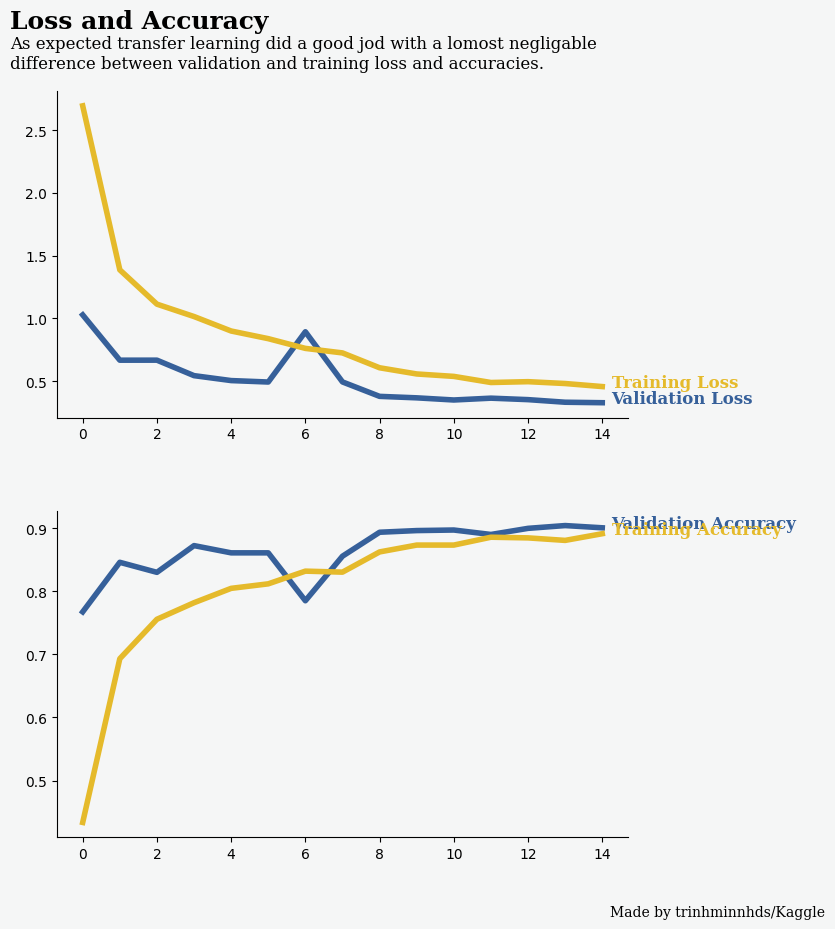

In [26]:
plot_training_model(history_efficienetB7)

In [40]:
effb7_model.tranable = True

# Set BatchNormlization layers as not trainale
for layer in effb7_model.layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainale = False

# let's see firts 10 layers
for l in effb7_model.layers[:20]:
    print(l.name, l.trainable)

input_layer False
rescaling False
normalization False
rescaling_1 False
stem_conv_pad False
stem_conv False
stem_bn False
stem_activation False
block1a_dwconv False
block1a_bn False
block1a_activation False
block1a_se_squeeze False
block1a_se_reshape False
block1a_se_reduce False
block1a_se_expand False
block1a_se_excite False
block1a_project_conv False
block1a_project_bn False
block1b_dwconv False
block1b_bn False


In [41]:
# Model Compile
model_efficienetB7.compile(
    optimizer = keras.optimizers.Adam(0.000005),
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

# Model Fit
history_efficienetB7 = model_efficienetB7.fit(
    train_effb7, 
    validation_data= valid_effb7,
    epochs = 15,
    callbacks= [
        EarlyStopping(monitor= 'val_loss', patience= 3, restore_best_weights= True),
        ReduceLROnPlateau(monitor = 'val_loss', factor= 0.3, patience= 2, mode= 'min')
    ]
)

Epoch 1/15


2024-06-21 17:34:00.073124: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/functional_5_1/efficientnetb7_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


252/252 ━━━━━━━━━━━━━━━━━━━━ 90s 213ms/step - accuracy: 0.9105 - loss: 0.3749 - val_accuracy: 0.9083 - val_loss: 0.3127 - learning_rate: 5.0000e-06
Epoch 2/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 46s 179ms/step - accuracy: 0.8941 - loss: 0.4215 - val_accuracy: 0.9083 - val_loss: 0.3151 - learning_rate: 5.0000e-06
Epoch 3/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 82s 179ms/step - accuracy: 0.9101 - loss: 0.3891 - val_accuracy: 0.9083 - val_loss: 0.3147 - learning_rate: 5.0000e-06
Epoch 4/15
252/252 ━━━━━━━━━━━━━━━━━━━━ 46s 178ms/step - accuracy: 0.9052 - loss: 0.3717 - val_accuracy: 0.9101 - val_loss: 0.3141 - learning_rate: 1.5000e-06


In [42]:
# Model Evaluate
evaluate_model(model_efficienetB7, test_effb7)

33/33 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - accuracy: 0.8993 - loss: 0.4215
Test Loss: 39.45%
Test Accuracy: 89.32%


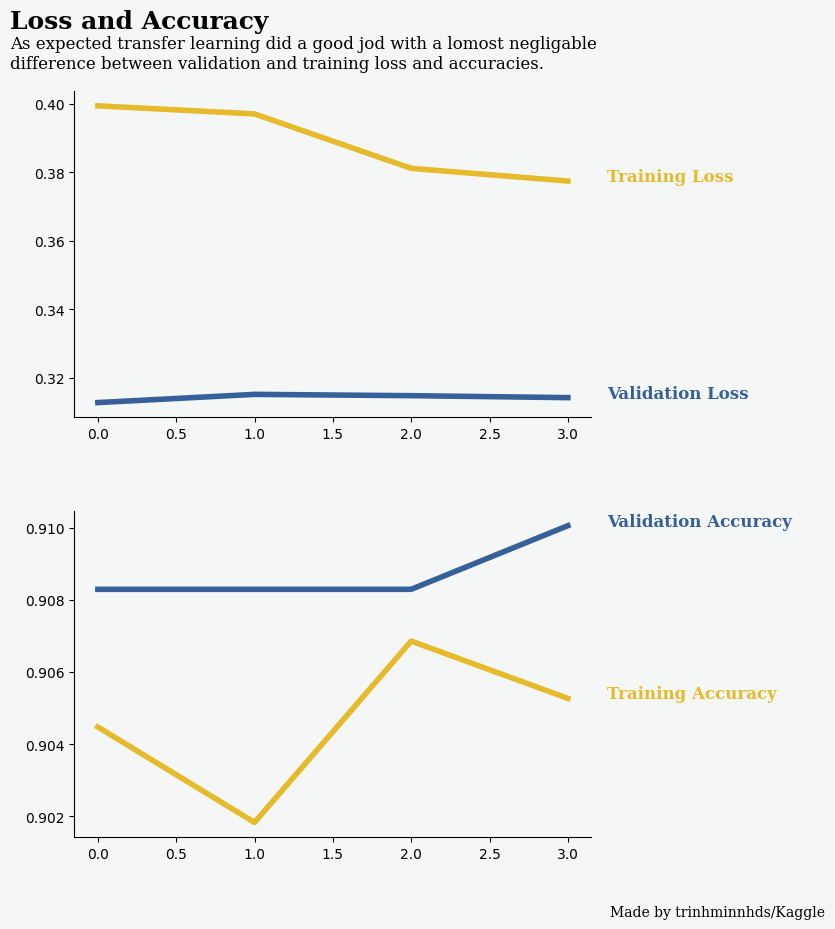

In [43]:
plot_training_model(history_efficienetB7)